**Historical Structures Classification**

There are hundreds of years-old historical structures that preserve a country's and community's history for future generations and promote tourism opportunities.To help the travel and tourism industries, it has been decided to use advanced machine learning techniques to monitor the condition of these historical structures and report to government agencies if any of them need maintenance.Also, understanding customers (tourists) and their expectations is critical for effective marketing. A recommendation engine is an excellent way to supplement existing marketing outreach to prospects.

**Part 1**

XYZ Pvt. Ltd., a leading industry consulting firm, has been hired to help the cause by
developing an intelligent and automated AI model using TensorFlow that can predict the
category of a structure in an image.

1. Plot the sample images (8–10) from each class or category to gain a better understanding of each class

 Hint: You can use the OpenCV open-source library for this task.

In [1]:
import tensorflow as tf
import os
import zipfile
import cv2 # OpenCV library
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import EfficientNetB0

import matplotlib.pyplot as plt # Import matplotlib for plotting
from sklearn.utils.class_weight import compute_class_weight




In [2]:
# --- Configuration (unchanged from previous steps) ---
TRAIN_DATASET_ZIP_PATH = './sample_data/dataset_hist_structures2.zip'
TRAIN_EXTRACT_PATH = './sample_data/data_extract'
IMAGE_HEIGHT = 224 # Consistent with EfficientNetB0
IMAGE_WIDTH = 224
RANDOM_SEED = 42 # For reproducibility of random selections


In [3]:
# Ensure the dataset is extracted
if not os.path.exists(TRAIN_EXTRACT_PATH):
    print(f"Extracting {TRAIN_DATASET_ZIP_PATH} to {TRAIN_EXTRACT_PATH}...")
    with zipfile.ZipFile(TRAIN_DATASET_ZIP_PATH, 'r') as zip_ref:
        zip_ref.extractall(TRAIN_EXTRACT_PATH)
    print("Train dataset extraction complete.")
else:
    print(f"{TRAIN_EXTRACT_PATH} already exists. Skipping train dataset extraction.")

# Set global random seed for reproducibility (for NumPy's random choices)
np.random.seed(RANDOM_SEED)

print("\n--- Visualizing Sample Images from Each Class ---")


Extracting ./sample_data/dataset_hist_structures2.zip to ./sample_data/data_extract...
Train dataset extraction complete.

--- Visualizing Sample Images from Each Class ---


Found 11 classes: altar, apse, bell_tower, column, dome(inner), dome(outer), flying_buttress, gargoyle, portal, stained_glass, vault

Displaying 8 samples for class: 'altar'

Displaying 8 samples for class: 'apse'

Displaying 8 samples for class: 'bell_tower'

Displaying 8 samples for class: 'column'

Displaying 8 samples for class: 'dome(inner)'

Displaying 8 samples for class: 'dome(outer)'

Displaying 8 samples for class: 'flying_buttress'

Displaying 8 samples for class: 'gargoyle'

Displaying 8 samples for class: 'portal'

Displaying 8 samples for class: 'stained_glass'

Displaying 8 samples for class: 'vault'


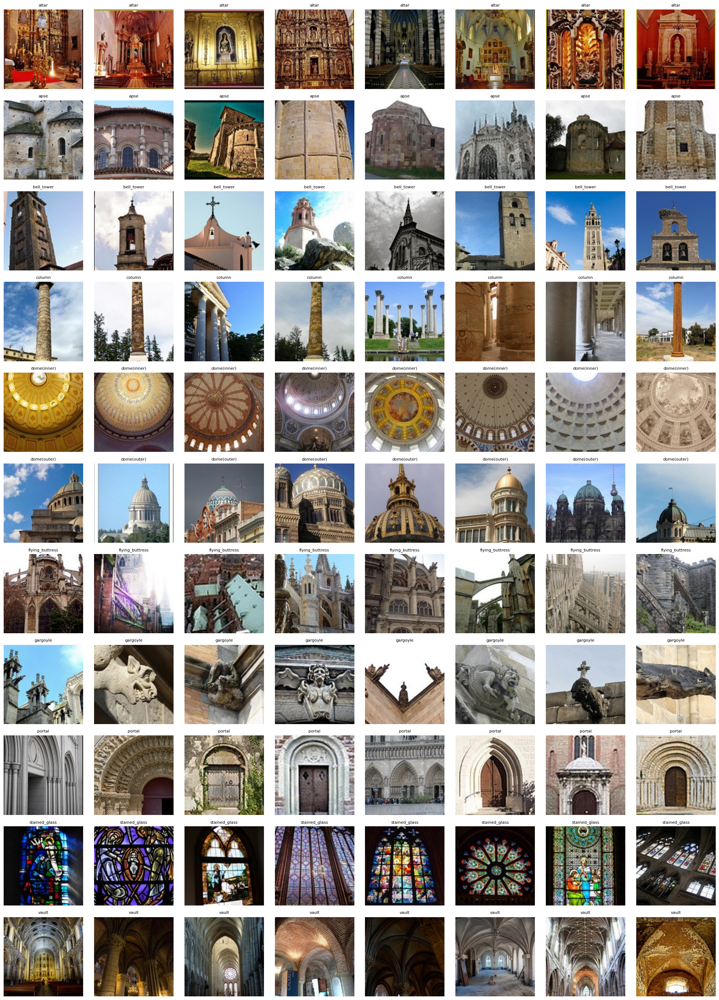


Image visualization complete. You should now have a visual understanding of each class.


In [4]:
EXTRACTED_PATH='./sample_data/data_extract/dataset_hist_structures/Stuctures_Dataset'
# Get a list of all class (category) directories
class_dirs = [d for d in os.listdir(EXTRACTED_PATH) if os.path.isdir(os.path.join(EXTRACTED_PATH, d))]
class_dirs.sort() # Sort to ensure consistent order

if not class_dirs:
    print(f"Error: No class subdirectories found in '{EXTRACTED_PATH}'.")
else:
    print(f"Found {len(class_dirs)} classes: {', '.join(class_dirs)}")

    # Define how many samples to plot per class
    samples_per_class = 8

    plt.figure(figsize=(20, len(class_dirs) * 2.5)) # Adjust figure size dynamically

    for i, class_name in enumerate(class_dirs):
        class_path = os.path.join(EXTRACTED_PATH, class_name)
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

        if not image_files:
            print(f"No image files found in class '{class_name}'. Skipping.")
            continue

        # Randomly select 'samples_per_class' images
        selected_images = np.random.choice(image_files, min(len(image_files), samples_per_class), replace=False)

        print(f"\nDisplaying {len(selected_images)} samples for class: '{class_name}'")

        for j, img_file in enumerate(selected_images):
            img_path = os.path.join(class_path, img_file)
            try:
                # Read image using OpenCV
                img = cv2.imread(img_path)
                if img is None:
                    print(f"Warning: Could not read image {img_path}. Skipping.")
                    continue

                # OpenCV reads images as BGR, Matplotlib expects RGB
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

                ax = plt.subplot(len(class_dirs), samples_per_class, i * samples_per_class + j + 1)
                ax.imshow(img_rgb)
                ax.set_title(f"{class_name}", fontsize=8) # Set title for each image subplot
                ax.axis('off')
            except Exception as e:
                print(f"Error processing image {img_path}: {e}")
                continue

    plt.tight_layout() # Adjusts subplot params for a tight layout
    plt.show()

print("\nImage visualization complete. You should now have a visual understanding of each class.")

 2. Select an CNN architecture of your choice to train the CV model. Configure the architecture for transfer learning, set up a TensorFlow environment for the selected backbone architecture, and load pre-trained weights
 Note: Algorithm or architecture selection is an important step in the training of ML models, so select the one that performs the best on your dataset.

 3. Deep learning models tend to work well with large amounts (millions of images) of data, but we may not always have enough data to train a deep learning model from scratch. Transfer learning techniques allow us to train and fine-tune large deep learning architectures using limited data.

  Hint: For transfer learning, use pre-trained CNN weights and freeze all convolutional layers' weights.

4. As of now, CNN architecture has been configured for our model. Modify the top of this architecture to work with our dataset by:

    • Adding an appropriate number of dense layers with an activation function.

    • Using dropout for regularization.
    
    Note: It is important to understand that these parameters are hyperparameters that must be tuned.

5. Compile the model with the right set of parameters like optimizer, loss function, and metric

6. Define your callback class to stop the training once validation accuracy reaches a certain number of your choice

7. Setup the train or test dataset directories and review the number of image samples for the train and test datasets for each class

8. Train the model without augmentation while continuously monitoring the validation accuracy

10. Train the model with augmentation and keep monitoring validation accuracy
Note: Choose carefully the number of epochs, steps per epoch, and validation steps based on your computer configuration.

11. Visualize training and validation accuracy on the y-axis against each epoch on the x-axis to see if the model overfits after a certain epoc

In [5]:


# --- Configuration ---
DATASET_ZIP_PATH = 'Structures_dataset.zip'
EXTRACT_PATH = 'Structures_dataset'
IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224
BATCH_SIZE = 32
RANDOM_SEED = 42
VALIDATION_SPLIT = 0.2
EPOCHS = 50 # Set a sufficiently high number of epochs, callback will stop training early

# Define INPUT_SHAPE explicitly here
INPUT_SHAPE = (IMAGE_HEIGHT, IMAGE_WIDTH, 3) # Correctly defined for 224x224 color images

# --- TensorFlow GPU Configuration ---
print("--- TensorFlow GPU Configuration ---")
try:
    gpus = tf.config.experimental.list_physical_devices('GPU')
    if gpus:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"GPUs available: {len(gpus)}. Memory growth set to True for all GPUs.")
    else:
        print("No GPU found. TensorFlow will run on CPU.")
except Exception as e:
    print(f"Error configuring GPU: {e}. TensorFlow will run on CPU.")

# Set global random seed for reproducibility
tf.random.set_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)



# --- 2. Load Training and Validation/Test Datasets ---
print("\n--- Loading Training and Validation/Test Datasets ---")

train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
    EXTRACTED_PATH,
    labels='inferred',
    label_mode='categorical',
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    interpolation='nearest',
    batch_size=BATCH_SIZE,
    shuffle=True, # Shuffle training data
    seed=RANDOM_SEED, # Important for reproducible split
    validation_split=VALIDATION_SPLIT,
    subset='training'
)

val_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
    EXTRACTED_PATH,
    labels='inferred',
    label_mode='categorical',
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    interpolation='nearest',
    batch_size=BATCH_SIZE,
    shuffle=False, # No need to shuffle validation data
    seed=RANDOM_SEED, # Important for reproducible split
    validation_split=VALIDATION_SPLIT,
    subset='validation'
)

class_names = train_ds_raw.class_names
NUM_CLASSES = len(class_names)



# Create label indices
class_indices = {name: idx for idx, name in enumerate(class_names)}
y_train_labels = [...]  # list of integer labels for your training data
for _, labels in train_ds_raw:
    y_train_labels.extend(labels.numpy())

y_train_labels =  np.array([np.argmax(label) for label in y_train_labels])

# Compute balanced class weights
weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train_labels),
    y=y_train_labels
)
class_weights = dict(enumerate(weights))



print(f"\nDetected classes: {class_names}")
print(f"Number of classes (NUM_CLASSES): {NUM_CLASSES}")
print(f"Total images in training set: {tf.data.experimental.cardinality(train_ds_raw).numpy() * BATCH_SIZE}")
print(f"Total images in validation/test set: {tf.data.experimental.cardinality(val_ds_raw).numpy() * BATCH_SIZE}")


# --- 3. Review Number of Image Samples for Each Class ---
print("\n--- Reviewing Sample Counts Per Class ---")

def count_samples_per_class(dataset, class_names):
    class_counts = {name: 0 for name in class_names}
    print(f"Counting samples for {len(class_names)} classes...")
    for _, labels in dataset:
        class_indices = tf.argmax(labels, axis=1).numpy()
        for idx in class_indices:
            class_counts[class_names[idx]] += 1
    return class_counts

print("\nCounts for Training Dataset:")
train_class_counts = count_samples_per_class(train_ds_raw, class_names)
for class_name, count in train_class_counts.items():
    print(f"  - {class_name}: {count} samples")

print("\nCounts for Validation/Test Dataset:")
val_class_counts = count_samples_per_class(val_ds_raw, class_names)
for class_name, count in val_class_counts.items():
    print(f"  - {class_name}: {count} samples")

counts_df = pd.DataFrame({
    'Class': class_names,
    'Train Samples': [train_class_counts[name] for name in class_names],
    'Validation/Test Samples': [val_class_counts[name] for name in class_names]
})
counts_df['Total Samples'] = counts_df['Train Samples'] + counts_df['Validation/Test Samples']
counts_df.set_index('Class', inplace=True)
counts_df.sort_values(by='Total Samples', ascending=False, inplace=True)

print("\nSummary of Samples Per Class (Train vs. Validation/Test):")
print(counts_df)

print("\nDataset setup and sample review complete.")

# --- 4. Dataset Optimization (Caching and Prefetching) ---
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds_raw.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds_raw.cache().prefetch(buffer_size=AUTOTUNE)
print("\nDataset performance optimized with .cache() and .prefetch().")


# --- 5. Define Data Augmentation Layers ---
print("\n--- Setting up Data Augmentation Layers ---")
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.1),
        layers.RandomContrast(0.1),
    ],
    name="data_augmentation",
)
print("Data augmentation layers defined.")


# --- 6. Define the Callback Class ---
class ValidationAccuracyCallback(keras.callbacks.Callback):
    """
    Custom Keras Callback to stop training once validation accuracy
    reaches or exceeds a specified target.
    """
    def __init__(self, target_accuracy):
        super().__init__()
        self.target_accuracy = target_accuracy
        self.best_val_accuracy = 0

    def on_epoch_end(self, epoch, logs=None):
        val_accuracy = logs.get("val_accuracy")
        if val_accuracy is not None:
            print(f" - Epoch {epoch+1}: Validation Accuracy = {val_accuracy*100:.2f}%")
            if val_accuracy > self.best_val_accuracy:
                self.best_val_accuracy = val_accuracy
            if val_accuracy >= self.target_accuracy:
                print(
                    f"\nReached target validation accuracy of {self.target_accuracy*100:.2f}%. Stopping training."
                )
                self.model.stop_training = True

# --- 7. Define the build_transfer_learning_model function ---
def build_transfer_learning_model(
    input_shape, # Now this correctly refers to the global INPUT_SHAPE
    num_classes,
    data_augmentation_layers=None,
    base_model_trainable=False,
    dense_layers_units=[256, 128],
    activation_function='relu',
    dropout_rate=0.3,
    learning_rate=0.001
):
    print("\n--- Loading Pre-trained EfficientNetB0 Base Model ---")
    base_model = EfficientNetB0(
        include_top=False,
        weights='imagenet',
        input_shape=input_shape # Correctly uses the passed input_shape
    )
    print("EfficientNetB0 base model loaded successfully with ImageNet weights.")
    print(f"Number of layers in base model: {len(base_model.layers)}")

    base_model.trainable = base_model_trainable
    if not base_model_trainable:
        print("Base model layers are frozen (not trainable) for initial transfer learning.")
    else:
        print("Base model layers are unfrozen (trainable) for fine-tuning.")

    inputs = keras.Input(shape=input_shape) # Correctly uses the passed input_shape

    # Conditionally apply augmentation
    if data_augmentation_layers:
        x = data_augmentation_layers(inputs)
        print("Data augmentation layers included in the model path.")
    else:
        x = inputs # No augmentation, pass inputs directly
        print("No data augmentation layers included in the model path.")

    x = base_model(x, training=False)
    x = layers.GlobalAveragePooling2D()(x)

    for i, units in enumerate(dense_layers_units):
        x = layers.Dense(units, activation=activation_function, name=f"dense_layer_{i+1}")(x)
        x = layers.Dropout(dropout_rate, name=f"dropout_layer_{i+1}")(x)

    outputs = layers.Dense(num_classes, activation='softmax', name="classification_head")(x)

    model = keras.Model(inputs, outputs)

    print("\n--- Compiling the Model ---")
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    print(f"  - Optimizer: Adam with learning rate = {learning_rate}")
    loss_function = keras.losses.CategoricalCrossentropy()
    print(f"  - Loss Function: CategoricalCrossentropy")
    metrics_to_monitor = ['accuracy']
    print(f"  - Metrics: {metrics_to_monitor}")

    model.compile(
        optimizer=optimizer,
        loss=loss_function,
        metrics=metrics_to_monitor
    )
    print("Model compiled successfully!")

    return model

# --- 8. Train the Model WITHOUT Augmentation ---
print("\n" + "="*80)
print("--- Training Model WITHOUT Data Augmentation ---")
print("="*80)

model_no_augmentation = build_transfer_learning_model(
    input_shape=INPUT_SHAPE, # Now correctly referencing the global INPUT_SHAPE
    num_classes=NUM_CLASSES,
    data_augmentation_layers=None,
    base_model_trainable=False,
    dense_layers_units=[256, 128],
    activation_function='relu',
    dropout_rate=0.3,
    learning_rate=0.001
)

print("\n--- Model Summary (Frozen Backbone, NO Augmentation Layer) ---")
model_no_augmentation.summary()

target_val_accuracy_no_aug = 0.9950
early_stopping_callback_no_aug = ValidationAccuracyCallback(target_val_accuracy_no_aug)

print(f"\n--- Starting Model Training (NO Augmentation) for up to {EPOCHS} epochs ---")
print(f"Monitoring validation accuracy. Training will stop if validation accuracy reaches {target_val_accuracy_no_aug*100:.2f}%")

history_no_aug = model_no_augmentation.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=[early_stopping_callback_no_aug],
    verbose=1,
    class_weight=class_weights
)

print("\nModel training WITHOUT augmentation completed (either reached target accuracy or max epochs).")

# --- Performance Matrix for Model WITHOUT Augmentation ---
print("\n--- Performance Metrics for Model WITHOUT Augmentation ---")
loss_no_aug, accuracy_no_aug = model_no_augmentation.evaluate(val_ds, verbose=0)
print(f"Validation Loss (No Augmentation): {loss_no_aug:.4f}")
print(f"Validation Accuracy (No Augmentation): {accuracy_no_aug*100:.2f}%")




# --- 10. Train the Model WITH Augmentation ---
print("\n\n" + "="*80)
print("--- Training Model WITH Data Augmentation ---")
print("="*80)

model_with_augmentation = build_transfer_learning_model(
    input_shape=INPUT_SHAPE, # Now correctly referencing the global INPUT_SHAPE
    num_classes=NUM_CLASSES,
    data_augmentation_layers=data_augmentation,
    base_model_trainable=False,
    dense_layers_units=[256, 128],
    activation_function='relu',
    dropout_rate=0.3,
    learning_rate=0.001
)

print("\n--- Model Summary (Frozen Backbone, WITH Augmentation Layer) ---")
model_with_augmentation.summary()

target_val_accuracy_aug = 0.9950
early_stopping_callback_aug = ValidationAccuracyCallback(target_val_accuracy_aug)

print(f"\n--- Starting Model Training (WITH Augmentation) for up to {EPOCHS} epochs ---")
print(f"Monitoring validation accuracy. Training will stop if validation accuracy reaches {target_val_accuracy_aug*100:.2f}%")

history_aug = model_with_augmentation.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=[early_stopping_callback_aug],
    verbose=1,
    class_weight=class_weights
)

print("\nModel training WITH augmentation completed (either reached target accuracy or max epochs).")

# --- Performance Matrix for Model WITH Augmentation ---
print("\n--- Performance Metrics for Model WITH Augmentation ---")
loss_aug, accuracy_aug = model_with_augmentation.evaluate(val_ds, verbose=0)
print(f"Validation Loss (With Augmentation): {loss_aug:.4f}")
print(f"Validation Accuracy (With Augmentation): {accuracy_aug*100:.2f}%")

# Extract metrics from the training history
history = history_aug.history
epochs_range = range(len(history['loss']))





--- TensorFlow GPU Configuration ---
GPUs available: 1. Memory growth set to True for all GPUs.

--- Loading Training and Validation/Test Datasets ---
Found 10543 files belonging to 11 classes.
Using 8435 files for training.
Found 10543 files belonging to 11 classes.
Using 2108 files for validation.

Detected classes: ['altar', 'apse', 'bell_tower', 'column', 'dome(inner)', 'dome(outer)', 'flying_buttress', 'gargoyle', 'portal', 'stained_glass', 'vault']
Number of classes (NUM_CLASSES): 11
Total images in training set: 8448
Total images in validation/test set: 2112

--- Reviewing Sample Counts Per Class ---

Counts for Training Dataset:
Counting samples for 11 classes...
  - altar: 671 samples
  - apse: 400 samples
  - bell_tower: 864 samples
  - column: 1542 samples
  - dome(inner): 491 samples
  - dome(outer): 943 samples
  - flying_buttress: 330 samples
  - gargoyle: 1230 samples
  - portal: 250 samples
  - stained_glass: 836 samples
  - vault: 878 samples

Counts for Validation/Tes

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_layer_1 (Dense)           │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_layer_1 (Dropout)       │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_layer_2 (Dense)           │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_layer_2 (Dropout)       │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_head (Dense)     │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,411,822 (16.83 MB)

 Trainable params: 362,251 (1.38 MB)

 Non-trainable params: 4,049,571 (15.45 MB)


--- Starting Model Training (NO Augmentation) for up to 50 epochs ---
Monitoring validation accuracy. Training will stop if validation accuracy reaches 99.50%
Epoch 1/50
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.7858 - loss: 0.7958 - Epoch 1: Validation Accuracy = 98.20%
264/264 ━━━━━━━━━━━━━━━━━━━━ 69s 170ms/step - accuracy: 0.7861 - loss: 0.7945 - val_accuracy: 0.9820 - val_loss: 0.0588
Epoch 2/50
263/264 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.9416 - loss: 0.2024 - Epoch 2: Validation Accuracy = 99.05%
264/264 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - accuracy: 0.9416 - loss: 0.2024 - val_accuracy: 0.9905 - val_loss: 0.0407
Epoch 3/50
263/264 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.9484 - loss: 0.1566 - Epoch 3: Validation Accuracy = 98.77%
264/264 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - accuracy: 0.9484 - loss: 0.1566 - val_accuracy: 0.9877 - val_loss: 0.0447
Epoch 4/50
263/264 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.9645 - loss: 0.1131 - Epoch 4: Val

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_layer_1 (Dense)           │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_layer_1 (Dropout)       │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_layer_2 (Dense)           │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_layer_2 (Dropout)       │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_head (Dense)     │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,411,822 (16.83 MB)

 Trainable params: 362,251 (1.38 MB)

 Non-trainable params: 4,049,571 (15.45 MB)


--- Starting Model Training (WITH Augmentation) for up to 50 epochs ---
Monitoring validation accuracy. Training will stop if validation accuracy reaches 99.50%
Epoch 1/50
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.7247 - loss: 0.9490 - Epoch 1: Validation Accuracy = 97.11%
264/264 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step - accuracy: 0.7251 - loss: 0.9476 - val_accuracy: 0.9711 - val_loss: 0.0776
Epoch 2/50
263/264 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.9175 - loss: 0.2853 - Epoch 2: Validation Accuracy = 97.53%
264/264 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - accuracy: 0.9176 - loss: 0.2852 - val_accuracy: 0.9753 - val_loss: 0.0701
Epoch 3/50
263/264 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.9316 - loss: 0.2354 - Epoch 3: Validation Accuracy = 98.34%
264/264 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - accuracy: 0.9316 - loss: 0.2354 - val_accuracy: 0.9834 - val_loss: 0.0556
Epoch 4/50
263/264 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.9334 - loss: 0.2129 - Epoch 4: V

Available keys in training history: dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


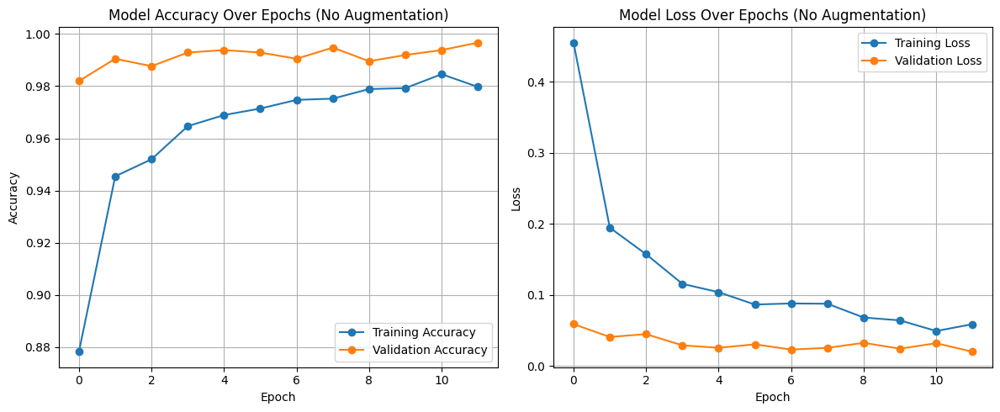

Available keys in training history: dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


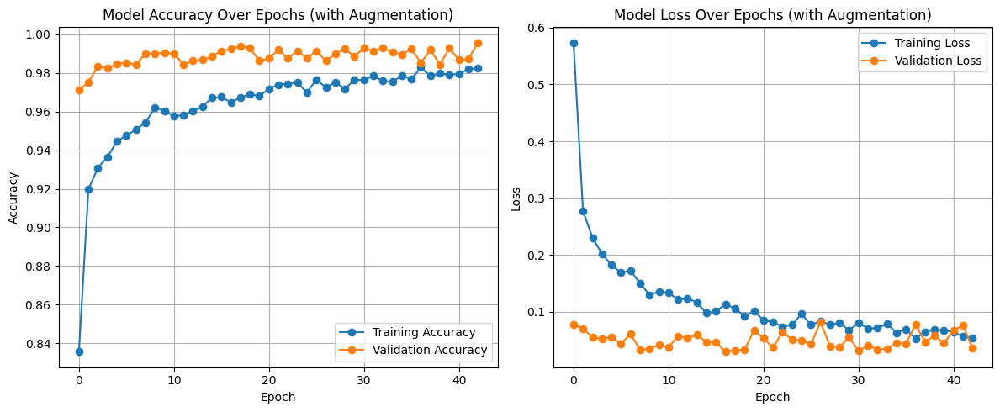

In [6]:
# Check available metrics in training history
print("Available keys in training history:", history_aug.history.keys())

# Plotting Accuracy and Loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history_no_aug.history.get('accuracy', []), label='Training Accuracy', marker='o')
plt.plot(history_no_aug.history.get('val_accuracy', []), label='Validation Accuracy', marker='o')
plt.title('Model Accuracy Over Epochs (No Augmentation)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss subplot
plt.subplot(1, 2, 2)
plt.plot(history_no_aug.history.get('loss', []), label='Training Loss', marker='o')
plt.plot(history_no_aug.history.get('val_loss', []), label='Validation Loss', marker='o')
plt.title('Model Loss Over Epochs (No Augmentation)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


# Check available metrics in training history
print("Available keys in training history:", history_aug.history.keys())

# Plotting Accuracy and Loss
plt.figure(figsize=(12, 5))


plt.subplot(1, 2, 1)
plt.plot(history_aug.history.get('accuracy', []), label='Training Accuracy', marker='o')
plt.plot(history_aug.history.get('val_accuracy', []), label='Validation Accuracy', marker='o')
plt.title('Model Accuracy Over Epochs (with Augmentation)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss subplot
plt.subplot(1, 2, 2)
plt.plot(history_aug.history.get('loss', []), label='Training Loss', marker='o')
plt.plot(history_aug.history.get('val_loss', []), label='Validation Loss', marker='o')
plt.title('Model Loss Over Epochs (with Augmentation)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
[1.6437090e-08 6.6370792e-10 1.2919845e-04 1.1472910e-03 2.1194291e-10
 7.6365110e-09 2.3352628e-07 2.5479155e-06 3.7344791e-10 9.9872071e-01
 5.4391979e-08]
['altar', 'apse', 'bell_tower', 'column', 'dome(inner)', 'dome(outer)', 'flying_buttress', 'gargoyle', 'portal', 'stained_glass', 'vault']
Predicted class label: stained_glass
Predicted class index: 9


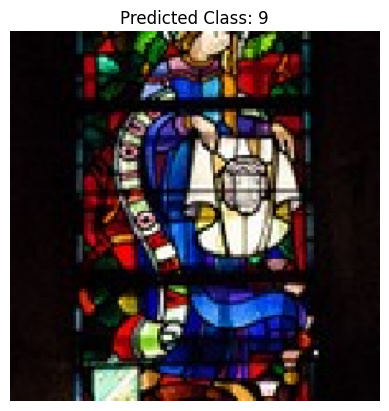

In [8]:
from tensorflow.keras.preprocessing import image
# Load and preprocess the image
img_path = './sample_data/data_extract/dataset_hist_structures/Stuctures_Dataset/stained_glass/10005682614_109bceeb1c_m.jpg'
img = image.load_img(img_path, target_size=(224, 224))  # Adjust size if needed
img_array = image.img_to_array(img)
img_array = img_array / 255.0  # Normalize to [0, 1]
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

# Make prediction
predictions = model_with_augmentation.predict(img_array)
print(predictions[0])
# If it's a classification task (e.g., softmax output):
predicted_class = np.argmax(predictions[0])
print(class_names)
print("Predicted class label:", class_names[predicted_class])


# Print the result
print("Predicted class index:", predicted_class)

plt.imshow(img)
plt.title(f"Predicted Class: {predicted_class}")
plt.axis('off')
plt.show()



**Part 2**

The second objectiveof this project requires you to perform exploratory data analysis and develop a recommendation engine that will help tourists visit their places of interest.

 1. Import all the datasets and perform preliminary inspections, such as:

        I.  Check for missing values and duplicates
        II. Remove any anomalies found in the data


In [ ]:


# Load datasets
user_df = pd.read_csv('./sample_data/user.csv')
place_df = pd.read_excel('./sample_data/tourism_with_id.xlsx')
rating_df = pd.read_csv('./sample_data/tourism_rating.csv')

# 1. Preview first few rows
print("User Dataset:")
print(user_df.head())

print("\nPlace Dataset:")
print(place_df.head())

print("\nRating Dataset:")
print(rating_df.head())

# 2. Check shape
print(f"\nUser shape: {user_df.shape}")
print(f"Place shape: {place_df.shape}")
print(f"Rating shape: {rating_df.shape}")

# 3. Check for missing values
print("\nMissing Values:")
print("User:\n", user_df.isnull().sum())
print("\nPlace:\n", place_df.isnull().sum())
print("\nRating:\n", rating_df.isnull().sum())

# 4. Check for duplicates
print("\nDuplicate rows:")
print("User:", user_df.duplicated().sum())
print("Place:", place_df.duplicated().sum())
print("Rating:", rating_df.duplicated().sum())

# 5. Remove duplicates if any
user_df = user_df.drop_duplicates()
place_df = place_df.drop_duplicates()
rating_df = rating_df.drop_duplicates()

# 6. Check anomalies (e.g., negative ages, impossible prices or ratings)
# Age anomaly
print("\nAge anomalies (User):")
print(user_df[user_df['Age'] < 0])

# Drop or fix negative age rows
user_df = user_df[user_df['Age'] >= 0]

# Price anomaly
print("\nPrice anomalies (Place):")
print(place_df[place_df['Price'] < 0])

# Drop negative prices if they exist
place_df = place_df[place_df['Price'] >= 0]

# Rating anomaly
print("\nRating anomalies (Rating):")
print(rating_df[(rating_df['Place_Ratings'] < 0) | (rating_df['Place_Ratings'] > 5)])

# Keep ratings between 0 and 5 only
rating_df = rating_df[(rating_df['Place_Ratings'] >= 0) & (rating_df['Place_Ratings'] <= 5)]

# 7. Ensure correct types
user_df['Age'] = pd.to_numeric(user_df['Age'], errors='coerce')
place_df['Rating'] = pd.to_numeric(place_df['Rating'], errors='coerce')
place_df['Price'] = pd.to_numeric(place_df['Price'], errors='coerce')
rating_df['Place_Ratings'] = pd.to_numeric(rating_df['Place_Ratings'], errors='coerce')

# 8. Final missing check after type casting
print("\nMissing values after type casting:")
print("User:\n", user_df.isnull().sum())
print("Place:\n", place_df.isnull().sum())
print("Rating:\n", rating_df.isnull().sum())




User Dataset:
   User_Id                   Location  Age
0        1      Semarang, Jawa Tengah   20
1        2         Bekasi, Jawa Barat   21
2        3        Cirebon, Jawa Barat   23
3        4         Bekasi, Jawa Barat   21
4        5  Lampung, Sumatera Selatan   20

Place Dataset:
   Place_Id                         Place_Name  \
0         1                   Monumen Nasional   
1         2                           Kota Tua   
2         3                      Dunia Fantasi   
3         4  Taman Mini Indonesia Indah (TMII)   
4         5           Atlantis Water Adventure   

                                         Description       Category     City  \
0  Monumen Nasional atau yang populer disingkat d...         Budaya  Jakarta   
1  Kota tua di Jakarta, yang juga bernama Kota Tu...         Budaya  Jakarta   
2  Dunia Fantasi atau disebut juga Dufan adalah t...  Taman Hiburan  Jakarta   
3  Taman Mini Indonesia Indah merupakan suatu kaw...  Taman Hiburan  Jakarta   
4  Atlantis

In [ ]:
# Remove  Unnamed columns from place_df
print(f'After  removing unnamed columns')
place_df = place_df.loc[:, ~place_df.columns.str.contains('^Unnamed')]
print(place_df['Time_Minutes'].head())
# Fill missing values with median
median_time = place_df['Time_Minutes'].median()
place_df['Time_Minutes'].fillna(median_time, inplace=True)

# Verify fill
print(place_df['Time_Minutes'].head())

# 4. Check for duplicates
print("\n Check Duplicate rows after deletion:")
print("User:", user_df.duplicated().sum())
print("Place:", place_df.duplicated().sum())
print("Rating:", rating_df.duplicated().sum())



After  removing unnamed columns
0     15.0
1     90.0
2    360.0
3      NaN
4     60.0
Name: Time_Minutes, dtype: float64
0     15.0
1     90.0
2    360.0
3     60.0
4     60.0
Name: Time_Minutes, dtype: float64

 Check Duplicate rows after deletion:
User: 0
Place: 0
Rating: 0


<ipython-input-5-cfb62feaf1cb>:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  place_df['Time_Minutes'].fillna(median_time, inplace=True)
<ipython-input-5-cfb62feaf1cb>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  place_df['Time_Minutes'].fillna(median_time, inplace=True)


 2. To understand the tourism highlights better, we should explore the data in depth.

    I. Explore the user group that provides the tourism ratings by:

        • Analyzing the age distribution of users visiting the places and rating them
        • Identifying the places where most of these users (tourists) are coming from


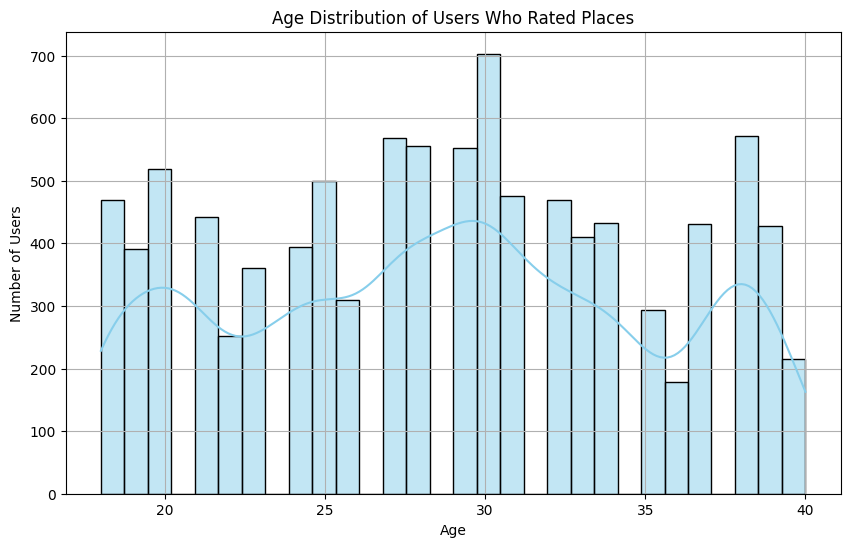

Most of these users (tourists) are coming from


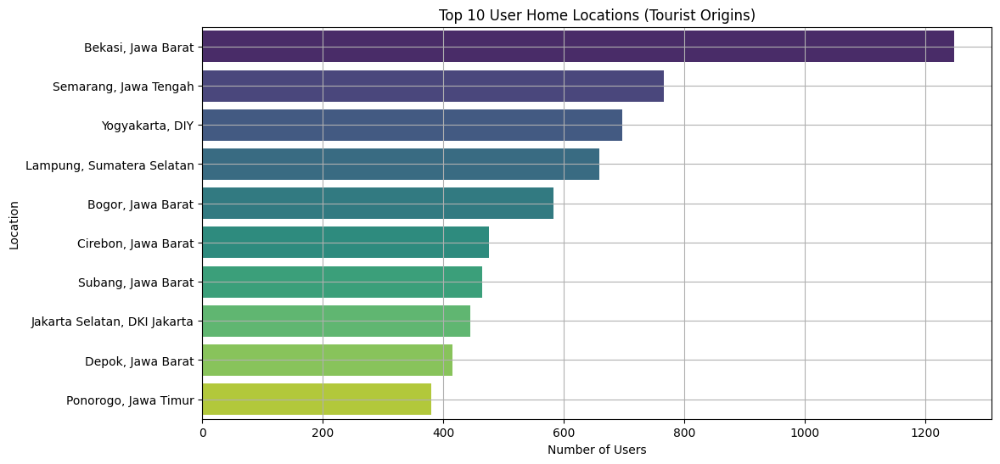

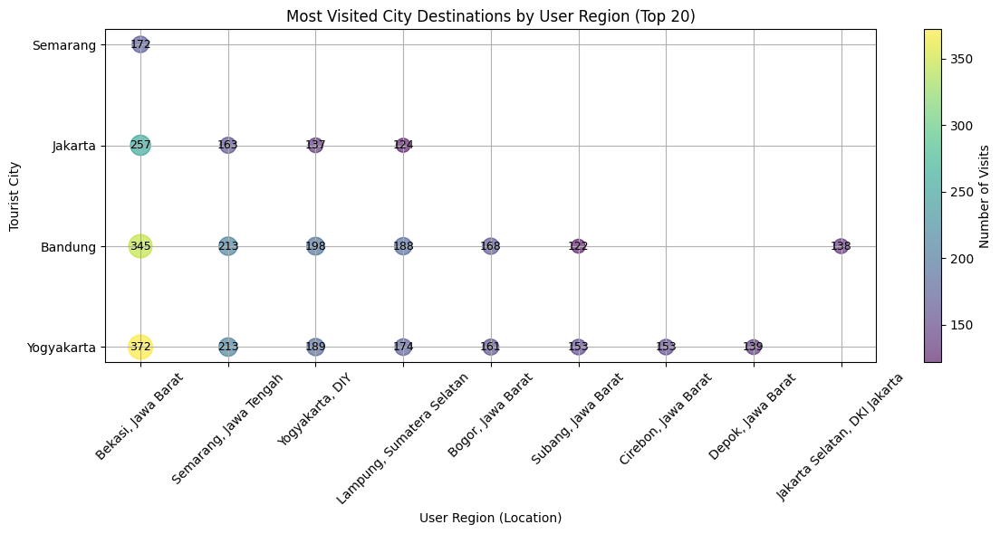

In [ ]:


#user_df
#place_df
#rating_df
merged_df = pd.merge(rating_df, user_df, on='User_Id')


plt.figure(figsize=(10, 6))
sns.histplot(merged_df['Age'], bins=30, kde=True, color='skyblue')
plt.title('Age Distribution of Users Who Rated Places')
plt.xlabel('Age')
plt.ylabel('Number of Users')
plt.grid(True)
plt.show()

final_df = pd.merge(merged_df, place_df, on='Place_Id')
top_locations = final_df['Location'].value_counts().head(10)
print(f'Most of these users (tourists) are coming from')


plt.figure(figsize=(12, 6))
sns.barplot(x=top_locations.values, y=top_locations.index, hue=top_locations.index,palette='viridis')
plt.title('Top 10 User Home Locations (Tourist Origins)')
plt.xlabel('Number of Users')
plt.ylabel('Location')
plt.grid(True)
plt.show()

#places are most visited by which user regions:
# Group by user location and destination city
popular_routes = final_df.groupby(['Location', 'City']).size().reset_index(name='visits')
popular_routes = popular_routes.sort_values(by='visits', ascending=False)




# Prepare data: Top 20 routes for clarity
top_routes = popular_routes.head(20)

# Create a scatter plot
plt.figure(figsize=(12, 6))
plt.scatter(top_routes['Location'], top_routes['City'], s=top_routes['visits'], alpha=0.6, c=top_routes['visits'], cmap='viridis')

# Add text labels for better readability
for i in range(len(top_routes)):
    plt.text(top_routes['Location'].iloc[i], top_routes['City'].iloc[i], str(top_routes['visits'].iloc[i]), fontsize=9, ha='center', va='center')

plt.title('Most Visited City Destinations by User Region (Top 20)')
plt.xlabel('User Region (Location)')
plt.ylabel('Tourist City')
plt.xticks(rotation=45)
plt.colorbar(label='Number of Visits')
plt.grid(True)
plt.tight_layout()
plt.show()

3. Next, let's explore the locations and categories of tourist spots.

      I. What are the different categories of tourist spots

The different categories of tourist spots are :
Budaya
Taman Hiburan
Cagar Alam
Bahari
Pusat Perbelanjaan
Tempat Ibadah


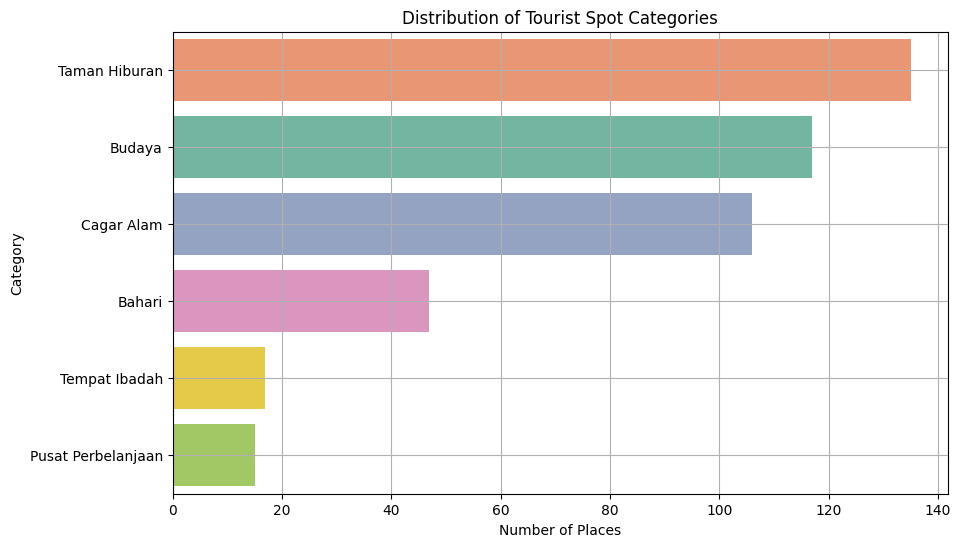

In [ ]:
categories = place_df['Category'].unique()
print(f'The different categories of tourist spots are :')
for category in categories:
    print(category)

plt.figure(figsize=(10, 6))
sns.countplot(data=place_df, y='Category', hue='Category', order=place_df['Category'].value_counts().index, palette="Set2")
plt.title("Distribution of Tourist Spot Categories")
plt.xlabel("Number of Places")
plt.ylabel("Category")
plt.grid(True)
plt.show()

II. What kind of tourism each location is most famous or suitable for?

Most Common Tourist Categories by City:
          City       Category  Count
1      Bandung     Cagar Alam     54
6      Jakarta         Budaya     32
13    Semarang     Cagar Alam     20
17    Surabaya         Budaya     18
26  Yogyakarta  Taman Hiburan     36


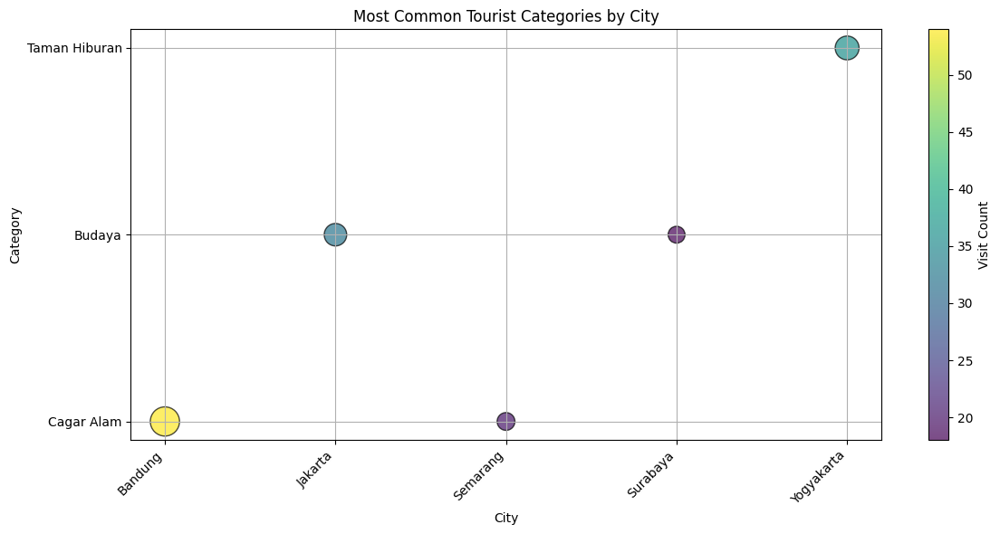

In [ ]:
final_df
#Count number of places per Category per City
city_category = place_df.groupby(['City', 'Category']).size().reset_index(name='Count')

# Find most common category per city
top_category_per_city = city_category.loc[city_category.groupby('City')['Count'].idxmax()]
print("Most Common Tourist Categories by City:")
print(top_category_per_city)



# Generate scatter plot
plt.figure(figsize=(12, 6))
scatter = plt.scatter(
    top_category_per_city['City'],
    top_category_per_city['Category'],
    s=top_category_per_city['Count'] * 10,  # scale up for visibility
    c=top_category_per_city['Count'],
    cmap='viridis',
    alpha=0.7,
    edgecolors='black'
)

# Add color bar for reference
plt.colorbar(scatter, label='Visit Count')

# Improve plot appearance
plt.title('Most Common Tourist Categories by City')
plt.xlabel('City')
plt.ylabel('Category')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.tight_layout()

#



III. Which city would be best for a nature enthusiast to visit?

Top Cities for Nature Enthusiasts:
         City  Nature_Spot_Count
0     Bandung                 54
1  Yogyakarta                 23
2    Semarang                 20
3    Surabaya                  5
4     Jakarta                  4


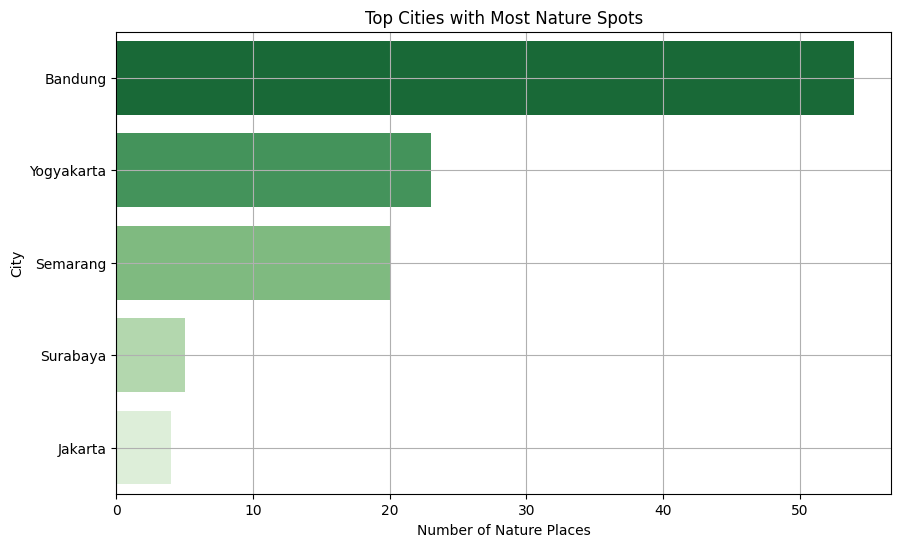

In [ ]:
# Filter for Nature-related places
nature_df = place_df[place_df['Category'].str.lower().str.contains('alam')]

# Count Nature spots by city
nature_by_city = nature_df['City'].value_counts().reset_index()
nature_by_city.columns = ['City', 'Nature_Spot_Count']

print("Top Cities for Nature Enthusiasts:")
print(nature_by_city)

# Optional: Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=nature_by_city, x='Nature_Spot_Count', y='City',hue="City", palette='Greens_r')
plt.title("Top Cities with Most Nature Spots")
plt.xlabel("Number of Nature Places")
plt.ylabel("City")
plt.grid(True)
plt.show()


4. To better understand tourism, we need to create a combined data with places and their user ratings.

 I. Use this data to figure out the spots that are most loved by the tourists. Also, which city has the most loved tourist spots?

Top 10 Most Loved Tourist Spots:
     Place_Id                             Place_Name  Place_Ratings
415       416                       Keraton Surabaya       3.933333
138       139  Puncak Gunung Api Purba - Nglanggeran       3.882353
51         52                           Kampung Cina       3.842105
321       322                            Bukit Jamur       3.793103
253       254                 Teras Cikapundung BBWS       3.789474
111       112               Bukit Bintang Yogyakarta       3.764706
96         97                  Monumen Yogya Kembali       3.761905
320       321            Glamping Lakeside Rancabali       3.750000
0           1                       Monumen Nasional       3.722222
156       157                           Pantai Baron       3.695652


<ipython-input-42-6cb3450e2389>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(x='Place_Name', y='Place_Ratings', data=top10, palette='viridis')


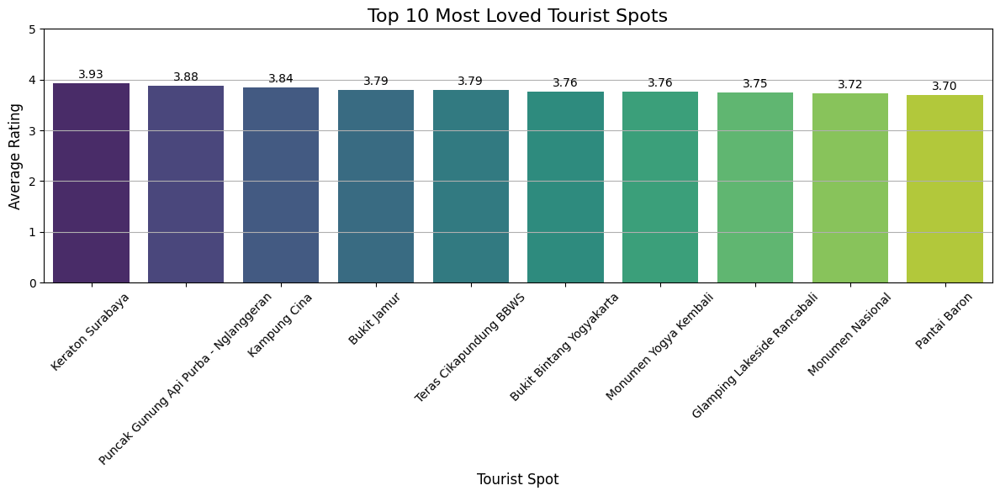

In [ ]:
# Compute average rating per place
top_rated_places = final_df.groupby(['Place_Id', 'Place_Name'])['Place_Ratings'].mean().reset_index()
top_rated_places = top_rated_places.sort_values(by='Place_Ratings', ascending=False)

print("Top 10 Most Loved Tourist Spots:")
print(top_rated_places.head(10))

# Get Top 10 most loved tourist spots
top10 = top_rated_places.head(10)


# Set plot size and style
plt.figure(figsize=(12, 6))
barplot = sns.barplot(x='Place_Name', y='Place_Ratings', data=top10, palette='viridis')

# Add rating values on top of each bar
for i, bar in enumerate(barplot.patches):
    rating = top10['Place_Ratings'].iloc[i]
    plt.text(
        bar.get_x() + bar.get_width() / 2,     # X coordinate (center of bar)
        bar.get_height() + 0.05,               # Y coordinate (a little above bar)
        f'{rating:.2f}',                       # Format to 2 decimal places
        ha='center', va='bottom', fontsize=10, color='black'
    )

# Add chart labels and title
plt.title('Top 10 Most Loved Tourist Spots', fontsize=16)
plt.xlabel('Tourist Spot', fontsize=12)
plt.ylabel('Average Rating', fontsize=12)
plt.xticks(rotation=45)
plt.ylim(0, 5)  # Assuming ratings are between 0 and 5
plt.grid(axis='y')

plt.tight_layout()
plt.show()



 II.  Indonesia provides a wide range of tourist spots ranging from historical and cultural beauties to advanced amusement parks. Among these, which category of places are users liking the most?

Cities with Most Loved Tourist Spots (by Avg Rating):
         City  Place_Ratings
4  Yogyakarta       3.104986
0     Bandung       3.079022
3    Surabaya       3.078035
2    Semarang       3.035850
1     Jakarta       3.007361


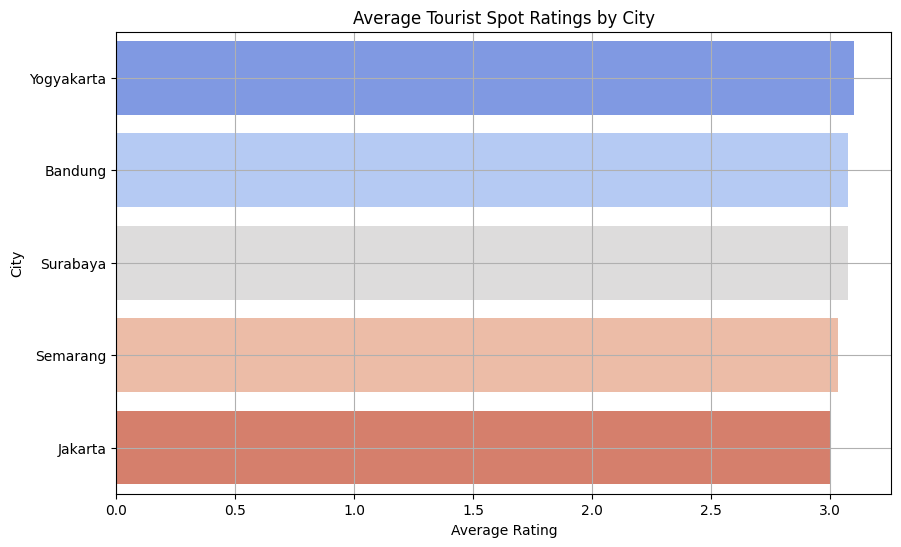

In [ ]:
# Average rating per place along with city
city_ratings = final_df.groupby('City')['Place_Ratings'].mean().reset_index()
city_ratings = city_ratings.sort_values(by='Place_Ratings', ascending=False)

print("Cities with Most Loved Tourist Spots (by Avg Rating):")
print(city_ratings)



plt.figure(figsize=(10, 6))
sns.barplot(data=city_ratings, x='Place_Ratings', y='City',hue='City', palette='coolwarm')
plt.title("Average Tourist Spot Ratings by City")
plt.xlabel("Average Rating")
plt.ylabel("City")
plt.grid(True)
plt.show()


5. Build a recommender model for the system

        I. Use the above data to develop a collaborative filtering model for recommendation and use that to recommend other places to visit using the current tourist location(place name)

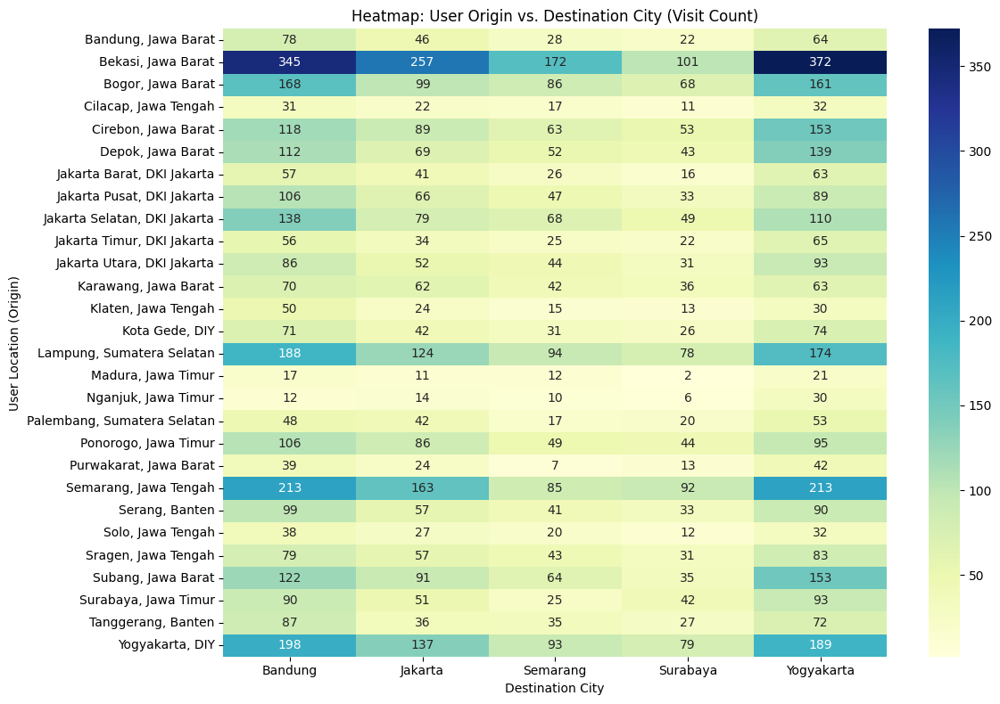

In [ ]:


# Step 1: Create a pivot table from final_df
heatmap_data = final_df.pivot_table(
    index='Location',     # user origin
    columns='City',       # destination city
    values='Place_Id',    # we can count place_id as proxy for visit
    aggfunc='count',      # count number of visits
    fill_value=0          # fill missing with 0
)

# Step 2: Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu')

# Step 3: Label and show
plt.title('Heatmap: User Origin vs. Destination City (Visit Count)')
plt.xlabel('Destination City')
plt.ylabel('User Location (Origin)')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import TruncatedSVD

# Load datasets
ratings_df = rating_df
places_df = place_df
print(ratings_df)
# Step 1: Create user-item interaction matrix
user_item_matrix = ratings_df.pivot_table(index='User_Id', columns='Place_Id', values='Place_Ratings').fillna(0)

# Step 2: Apply SVD
svd = TruncatedSVD(n_components=20, random_state=42)
matrix_svd = svd.fit_transform(user_item_matrix)

# Step 3: Reconstruct approximate ratings matrix
reconstructed_matrix = np.dot(matrix_svd, svd.components_)
reconstructed_df = pd.DataFrame(reconstructed_matrix, index=user_item_matrix.index, columns=user_item_matrix.columns)

# Step 4: Recommendation function
def recommend_similar_places(current_place_name, top_n=5):
    # Get Place_Id for the given place name
    place_id = places_df[places_df['Place_Name'] == current_place_name]['Place_Id'].values
    if len(place_id) == 0:
        return f"Place '{current_place_name}' not found in database."

    place_id = place_id[0]
    if place_id not in reconstructed_df.columns:
        return f"No rating data found for '{current_place_name}'."

    # Get similarity with all other places using Pearson correlation
    place_vector = reconstructed_df[place_id].values
    similarities = reconstructed_df.corrwith(pd.Series(place_vector, index=reconstructed_df.index), axis=0)

    # Get top-N similar places excluding the current one
    similar_places = similarities.drop(place_id).sort_values(ascending=False).head(top_n).index
    recommended_place_names = places_df[places_df['Place_Id'].isin(similar_places)]['Place_Name'].tolist()

    return recommended_place_names

# Example usage
example_place = "Goa Rancang Kencono"
recommendations = recommend_similar_places(example_place)

print(f"Recommendations for '{example_place}':")
for i, rec in enumerate(recommendations, 1):
    print(f"{i}. {rec}")


      User_Id  Place_Id  Place_Ratings
0           1       179              3
1           1       344              2
2           1         5              5
3           1       373              3
4           1       101              4
...       ...       ...            ...
9995      300       425              2
9996      300        64              4
9997      300       311              3
9998      300       279              4
9999      300       163              2

[9921 rows x 3 columns]
Recommendations for 'Goa Rancang Kencono':
1. Pantai Ngobaran
2. Kampung Wisata Dipowinatan
3. Kawah Rengganis Cibuni
4. Saloka Theme Park
5. Museum Kesehatan Dr. Adhyatma
